In [1]:
import os
import re
import numpy as np            
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
sc.set_figure_params(dpi=100, color_map='viridis', fontsize=6)
#sc.settings.verbosity=2
#sc.settings.n_jobs=1
#sc.logging.print_versions()

In [44]:
adata = sc.read_h5ad("new_count_umap_dim18_spread2.5_mindist0.7_celltypes_250416.h5ad")

In [7]:
#counts = pd.read_csv("raw_counts.csv", index_col=0)

In [8]:
#adata.layers["counts"] = counts.values.T  # 或稀疏矩阵格式（根据数据大小选择）

In [9]:
#adata.write_h5ad("new_count_umap_dim18_spread2.5_mindist0.7_celltypes_250416.h5ad")

In [45]:
# 定义要分析的多个细胞类型
target_types = ['Rgl1-like', 'DA progenitor-FABP7', 'DA progenitor-CHRNA6 high','DA progenitor-CHRNA6 low','DA progenitor-terminal',
               'Immature DA','Mature DA']  # 替换为你的目标类型

# 提取多类别子集（保留交集基因）
adata_sub = adata[adata.obs['human_celltypes_250416'].isin(target_types), :].copy()

# 检查细胞数量分布
print(adata_sub.obs['human_celltypes_250416'].value_counts())

human_celltypes_250416
DA progenitor-FABP7          4886
DA progenitor-terminal       2011
Rgl1-like                    1425
DA progenitor-CHRNA6 low      957
DA progenitor-CHRNA6 high     865
Immature DA                   756
Mature DA                     132
Name: count, dtype: int64


In [46]:
# 2. 创建重命名映射字典（示例）
cluster_rename = {
    'DA progenitor-CHRNA6 low': 'DA progenitor-CHRNB3 low',
    'DA progenitor-CHRNA6 high': 'DA progenitor-CHRNB3 high'
}

# 3. 使用pandas的replace方法进行替换
adata_sub.obs['human_celltypes_250418'] = adata_sub.obs['human_celltypes_250416'].replace(cluster_rename)

# 或者直接修改原列（建议先备份）
# adata.obs['leiden'] = adata.obs['leiden'].replace(cluster_rename)

# 4. 验证修改结果
print(adata_sub.obs['human_celltypes_250418'].value_counts())


human_celltypes_250418
DA progenitor-FABP7          4886
DA progenitor-terminal       2011
Rgl1-like                    1425
DA progenitor-CHRNB3 low      957
DA progenitor-CHRNB3 high     865
Immature DA                   756
Mature DA                     132
Name: count, dtype: int64


/tmp/ipykernel_4015053/345409625.py:8: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  adata_sub.obs['human_celltypes_250418'] = adata_sub.obs['human_celltypes_250416'].replace(cluster_rename)


In [26]:
adata_sub.layers["counts"] = adata_sub.X.copy()

In [36]:
sc.pp.normalize_total(adata_sub)
# Logarithmize the data
sc.pp.log1p(adata_sub)

In [7]:
adata_sub.obs["batch"]

rat12M_A_CTCCTCCAGCTGCCTG-1    rat12M_A
rat12M_A_CAGGCCACATTGTTGG-1    rat12M_A
rat12M_A_CTGTCGTGTGAGCGAT-1    rat12M_A
rat12M_A_GTTACCCGTTGATGTC-1    rat12M_A
rat12M_A_CGGGACTGTCAGGAGT-1    rat12M_A
                                 ...   
P1B_CAGCGTGCACTGCATA-1              P1B
P1B_GAAATGAGTTGTCATG-1              P1B
P1B_ATCAGGTCATTGCAGT-1              P1B
P1B_CTCATTAAGCATTTAC-1              P1B
P1B_AGAACAAAGACTGGGT-1              P1B
Name: batch, Length: 11032, dtype: category
Categories (29, object): ['rat12M_A', 'rat12M_BC', 'rat12M_D', 'rat12M_E', ..., 'rat8M_F', 'rat1.5M_ABCDEF', 'P1A', 'P1B']

In [27]:
sc.pp.highly_variable_genes(adata_sub, n_top_genes=2000, batch_key="sample")

In [28]:
sc.tl.pca(adata_sub)

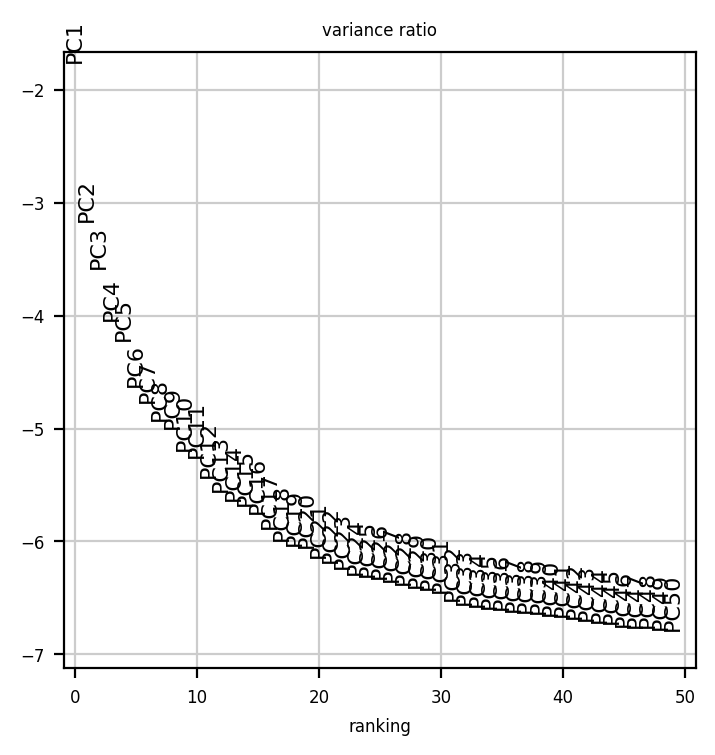

In [37]:
sc.pl.pca_variance_ratio(adata_sub, n_pcs=50, log=True)

In [54]:
adata_sub.obs['batch'].value_counts()

batch
P1A               5173
P1B               3728
rat12M_A           184
rat12M_D           166
rat8M_F            159
rat12M_E           155
rat12M_F           152
rat8M_A            147
rat8M_B            143
rat12M_BC          131
rat8M_D            126
rat18M_E            87
rat18M_B            86
rat1.5M_ABCDEF      84
rat18M_F            84
rat18M_A            79
rat18M_C            67
rat18M_D            63
rat3.5M_D           40
rat3.5M_C           34
rat3.5M_E           32
rat3.5M_F           30
rat3.5M_A           28
rat5.5M_BDE         18
rat5.5M_F           13
rat5.5M_C           12
rat5.5M_A           11
Name: count, dtype: int64

In [10]:
adata_sub.obs['batch'] = adata_sub.obs['batch'].replace({'rat5.5M_E': 'rat5.5M_BDE', 'rat5.5M_B': 'rat5.5M_BDE', 'rat5.5M_D': 'rat5.5M_BDE'})

/tmp/ipykernel_4015053/1444040079.py:1: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  adata_sub.obs['batch'] = adata_sub.obs['batch'].replace({'rat5.5M_E': 'rat5.5M_BDE', 'rat5.5M_B': 'rat5.5M_BDE', 'rat5.5M_D': 'rat5.5M_BDE'})


In [59]:
adata_sub

AnnData object with n_obs × n_vars = 11032 × 24190
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'RNA_snn_res.0.1', 'RNA_snn_res.0.2', 'RNA_snn_res.0.3', 'RNA_snn_res.0.4', 'RNA_snn_res.0.5', 'RNA_snn_res.0.6', 'RNA_snn_res.0.7', 'RNA_snn_res.0.8', 'RNA_snn_res.0.9', 'RNA_snn_res.1', 'seurat_clusters', 'prop_rat', 'prop_human', 'species', 'celltype', 'stages', 'new_resolution', 'final_resolution', 'final_resolution1', 'final_resolution2', 'final_resolution3', 'final_resolution4', 'celltype_new', 'qufen_celltype', 'dataset', 'sample', 'percent_MT', 'batch', 'human_celltypes', 'human_celltypes_250314', 'human_celltypes_250323', 'RNA_snn_res.1.1', 'RNA_snn_res.1.2', 'RNA_snn_res.1.3', 'RNA_snn_res.1.4', 'RNA_snn_res.1.5', 'RNA_snn_res.1.6', 'RNA_snn_res.1.7', 'RNA_snn_res.1.8', 'RNA_snn_res.1.9', 'RNA_snn_res.2', 'RNA_snn_res.2.1', 'RNA_snn_res.2.2', 'RNA_snn_res.2.3', 'RNA_snn_res.2.4', 'RNA_snn_res.2.5', 'RNA_snn_res.2.6', 'RNA_snn_res.2.7', 'RNA_snn_res.2.8', 'RNA_

In [11]:
import bbknn
bbknn.bbknn(adata_sub, batch_key='batch')

/home/liuxiaodongLab/jiangjing/.local/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [51]:
sc.pp.neighbors(
        adata_sub,
        n_neighbors=10,
        n_pcs=23,
        use_rep='X_integrated.rpca',  # 确保使用已校正的 PCA
        random_state=18
    )

In [52]:
sc.tl.umap(adata_sub, min_dist=0.5,spread=0.5)

In [53]:
for res in np.round(np.arange(0.1, 1.1, 0.1),1):
    sc.tl.leiden(
        adata_sub, key_added=f"leiden_res_{res}", resolution=res, flavor="igraph"
    )

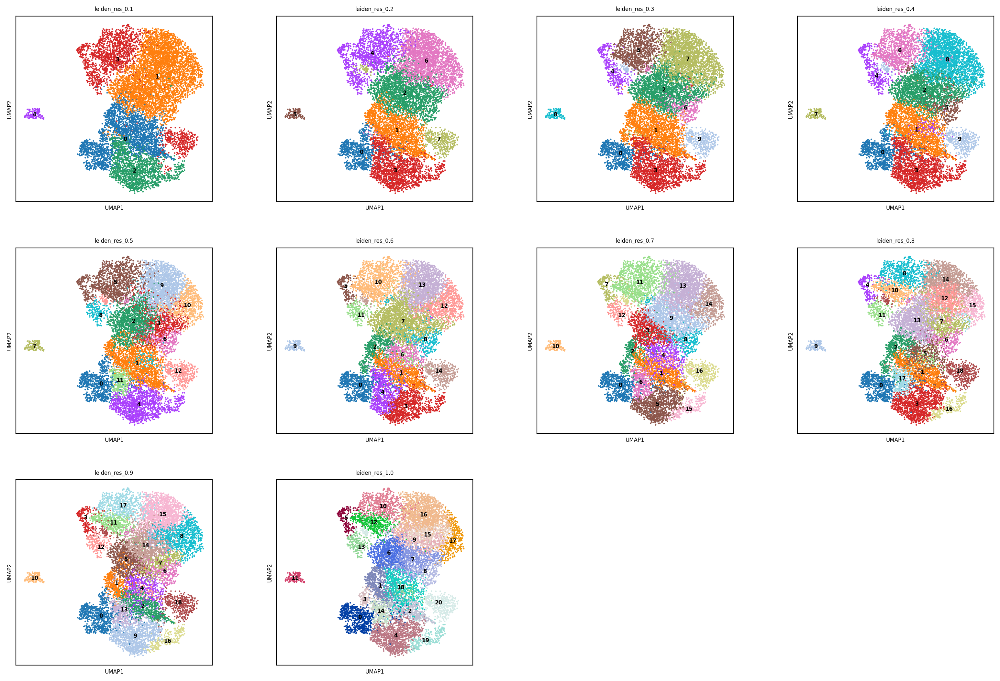

In [54]:
sc.pl.umap(
    adata_sub,
    color=["leiden_res_0.1", "leiden_res_0.2", "leiden_res_0.3","leiden_res_0.4", "leiden_res_0.5", "leiden_res_0.6",
           "leiden_res_0.7", "leiden_res_0.8", "leiden_res_0.9","leiden_res_1.0"],
    legend_loc="on data",
)

<Axes: title={'center': 'human_celltypes_250418'}, xlabel='UMAP1', ylabel='UMAP2'>

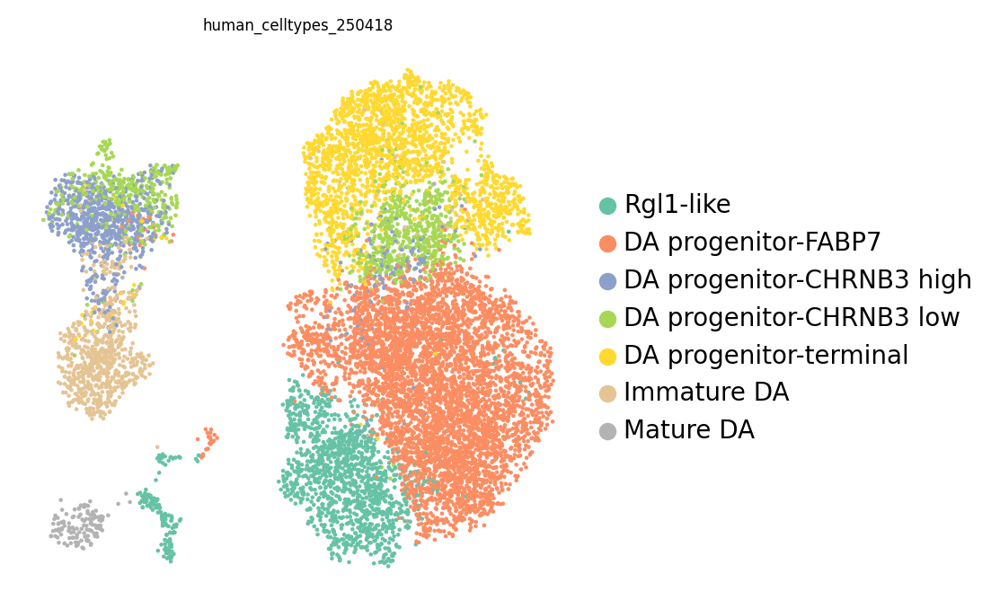

In [43]:
 sc.pl.umap(
        adata_sub,
        color='human_celltypes_250418',
        palette='Set2',
        legend_fontsize=10,
        legend_fontoutline=2,
        frameon=False,
        show=False  # 避免自动显示，便于批量保存
    )
    

In [55]:
adata_sub.write("20250701_test.h5ad")

In [24]:
import itertools  # 用于生成参数组合

# 定义待测试的参数范围
n_pcs_list = list(range(20, 30))        # 测试不同的 n_pcs 值
n_neighbors_list = list(range(20, 50,1))
#min_dist_list = np.round(np.arange(0.1, 0.7, 0.2),1)  # UMAP 的 min_dist 参数
#spread_list = np.round(np.arange(0.5, 3, 0.5),1)   # UMAP 的 spread 参数

# 遍历所有参数组合
for n_pcs, n_neighbors in itertools.product(n_pcs_list, n_neighbors_list):
#for random_state in random_states:
    # 复制原始数据，避免覆盖原有结果
    adata_temp = adata_sub.copy()
    # Step 1: 计算邻居图（使用当前 n_pcs）
    sc.pp.neighbors(
        adata_temp,
        n_neighbors=n_neighbors,
        n_pcs=n_pcs,
        use_rep='X_integrated.rpca',  # 确保使用已校正的 PCA
        random_state=18
    )
    
    # Step 2: 计算 UMAP（应用当前 min_dist 和 spread）
    sc.tl.umap(
        adata_temp,
        min_dist=0.5,
        spread=0.5
    )
    
    # Step 3: 绘制 UMAP 图并标注参数
    sc.pl.umap(
        adata_temp,
        color='human_celltypes_250418',
        palette='Set2',
        title=f'n_neighbors={n_neighbors},n_pcs={n_pcs},min_dist=0.5,spread=0.5',  # 标题显示参数
        legend_fontsize=10,
        legend_fontoutline=2,
        frameon=False,
        show=False  # 避免自动显示，便于批量保存
    )
    
    # 可选：保存图片到文件
    plt.savefig(f'./umap_figure/UMAP_n_pcs_{n_pcs}_n_neighbors_{n_neighbors}_spread_0.5_min_dist_0.5.png', dpi=300, bbox_inches='tight')
    plt.close()  # 关闭当前图像，释放内存

computing neighbors
    finished (0:00:02)
computing UMAP
    finished (0:00:08)
computing neighbors
    finished (0:00:02)
computing UMAP
    finished (0:00:08)
computing neighbors
    finished (0:00:02)
computing UMAP
    finished (0:00:08)
computing neighbors
    finished (0:00:02)
computing UMAP
    finished (0:00:08)
computing neighbors
    finished (0:00:02)
computing UMAP
    finished (0:00:08)
computing neighbors
    finished (0:00:02)
computing UMAP
    finished (0:00:08)
computing neighbors
    finished (0:00:03)
computing UMAP
    finished (0:00:09)
computing neighbors
    finished (0:00:03)
computing UMAP
    finished (0:00:09)
computing neighbors
    finished (0:00:03)
computing UMAP
    finished (0:00:09)
computing neighbors
    finished (0:00:03)
computing UMAP
    finished (0:00:09)
computing neighbors
    finished (0:00:03)
computing UMAP
    finished (0:00:09)
computing neighbors
    finished (0:00:03)
computing UMAP
    finished (0:00:09)
computing neighbors
    fini

In [26]:
sc.set_figure_params(figsize=(6,6), frameon=True)  # frameon=True 显示坐标系背景
n_neighbors=10
n_pcs=21
min_dist=0.1
spread=0.5

sc.pp.neighbors(
    adata_sub, 
    n_neighbors=n_neighbors, 
    n_pcs=n_pcs,  # 使用校正后的前30个PC
    use_rep='X_integrated.rpca' # 明确指定使用校正后的PCA
)
sc.tl.umap(adata_sub, min_dist=min_dist,spread=spread)
sc.pl.umap(
       adata_sub,
       color='human_celltypes_250416',
       palette='Set2',
       #legend_loc='on data',
       show=False,
       frameon=False,
       title=f'n_neighbors={n_neighbors},n_pcs={n_pcs}, min_dist={min_dist}, spread={spread}'
       # save=f'UMAP_n_neighbors{n_neighbors}_npcs{n_pcs}_mindist{min_dist}_spread{spread}.png'
   )
plt.savefig(f'./test_figures/UMAP_n_neighbors{n_neighbors}_npcs{n_pcs}_mindist{min_dist}_spread{spread}.png', dpi=300, bbox_inches='tight')
plt.close()

computing neighbors
    finished (0:00:02)
computing UMAP
    finished (0:00:06)


computing neighbors
    finished (0:00:04)
computing UMAP
    finished (0:00:09)


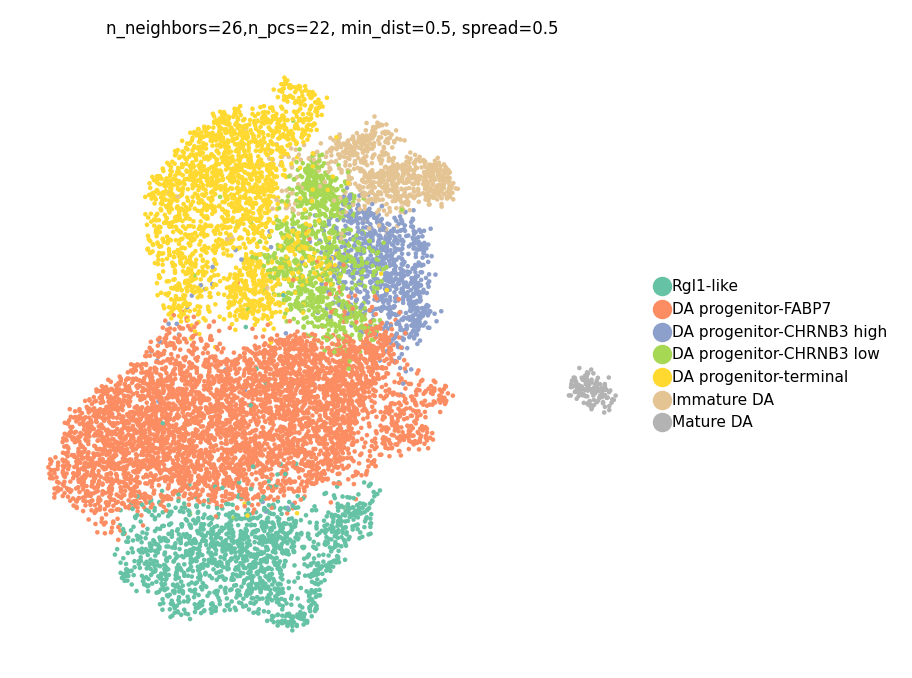

In [25]:

n_neighbors=26
n_pcs=22
min_dist=0.5
spread=0.5

sc.pp.neighbors(
    adata_sub, 
    n_neighbors=n_neighbors, 
    n_pcs=n_pcs,  # 使用校正后的前30个PC
    use_rep='X_integrated.rpca', # 明确指定使用校正后的PCA
    random_state=18
)
sc.tl.umap(adata_sub, min_dist=min_dist,spread=spread)
sc.pl.umap(
       adata_sub,
       color='human_celltypes_250418',
       palette='Set2',
       show=True,
       frameon=False,
       title=f'n_neighbors={n_neighbors},n_pcs={n_pcs}, min_dist={min_dist}, spread={spread}',
       #save=f'UMAP_n_neighbors{n_neighbors}_npcs{n_pcs}_mindist{min_dist}_spread{spread}.png'
   )
adata_sub.write("scanpy_UMAP_n_neighbors26_npcs22_mindist0.5_spread0.5.h5ad")

computing neighbors
    finished (0:00:03)
computing UMAP
    finished (0:00:10)


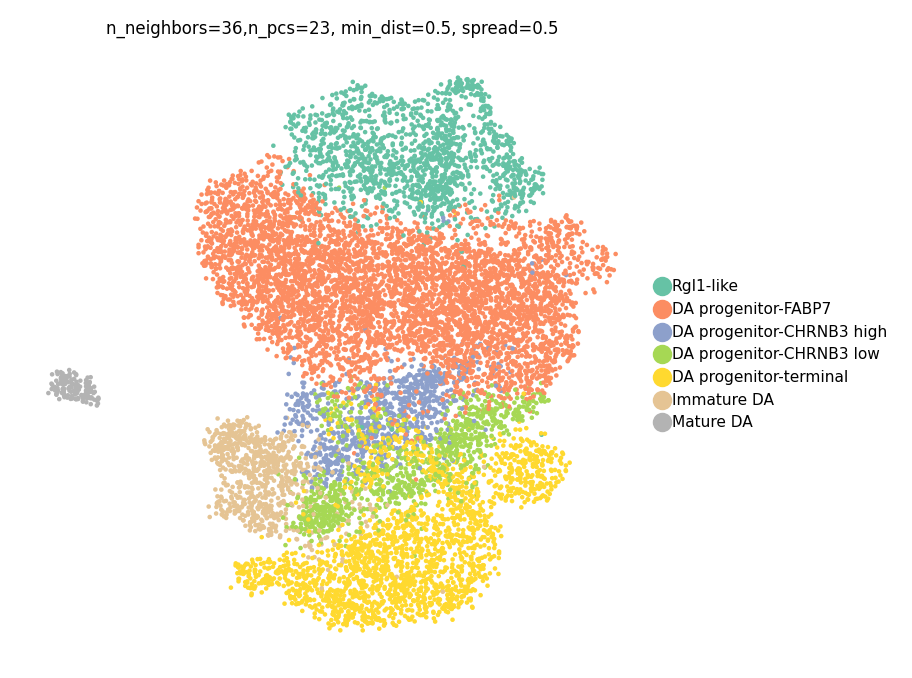

In [26]:
n_neighbors=36
n_pcs=23
min_dist=0.5
spread=0.5

sc.pp.neighbors(
    adata_sub, 
    n_neighbors=n_neighbors, 
    n_pcs=n_pcs,  # 使用校正后的前30个PC
    use_rep='X_integrated.rpca', # 明确指定使用校正后的PCA
    random_state=18
)
sc.tl.umap(adata_sub, min_dist=min_dist,spread=spread)
sc.pl.umap(
       adata_sub,
       color='human_celltypes_250418',
       palette='Set2',
       show=True,
       frameon=False,
       title=f'n_neighbors={n_neighbors},n_pcs={n_pcs}, min_dist={min_dist}, spread={spread}',
       #save=f'UMAP_n_neighbors{n_neighbors}_npcs{n_pcs}_mindist{min_dist}_spread{spread}.png'
   )
adata_sub.write("scanpy_UMAP_n_neighbors36_npcs23_mindist0.5_spread0.5.h5ad")

In [11]:
adata_sub.write("scanpy_UMAP_n_neighbors10_npcs23_mindist0.5_spread0.5.h5ad")

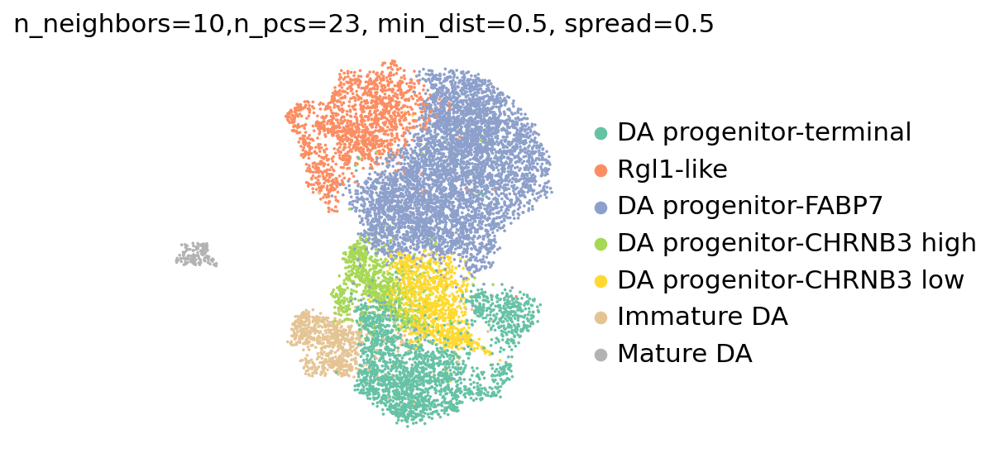

In [30]:
# 将目标聚类名称替换为你的实际聚类名称，例如 "Oligodendrocytes"
target_cluster = "DA progenitor-terminal"  

# 获取当前分类顺序
categories = adata_sub.obs['human_celltypes_250418'].cat.categories.tolist()

# 将目标聚类移动到列表最前面
categories.insert(0, categories.pop(categories.index(target_cluster)))

# 重新设置分类顺序
adata_sub.obs['human_celltypes_250418'] = adata_sub.obs['human_celltypes_250418'].cat.reorder_categories(categories)

sc.pl.umap(
    adata_sub,
    color='human_celltypes_250418',
    palette='Set2',
    show=True,
    frameon=False,
    sort_order=True,
    title=f'n_neighbors={n_neighbors},n_pcs={n_pcs}, min_dist={min_dist}, spread={spread}',
    save=f'UMAP_n_neighbors{n_neighbors}_npcs{n_pcs}_mindist{min_dist}_spread{spread}.pdf'
)


In [2]:
adata_sub = sc.read_h5ad("/storage/liuxiaodongLab/jiangjing/Projects/YutingFu/PD_YutingFu/umap_monocle3_cytoTRACE2_neighbors26_npcs24/scanpy_UMAP_n_neighbors26_npcs24_mindist0.5_spread0.5.h5ad")

In [4]:
import scipy
# 检查是否存在 "counts" 的 layer
if "counts" in adata_sub.layers:
    counts_matrix = adata_sub.layers["counts"]
    
    # 处理稀疏矩阵：如果是稀疏格式，需转换为密集数组（注意内存问题）
    if isinstance(counts_matrix, scipy.sparse.spmatrix):
        counts_matrix = counts_matrix.toarray()
    
    # 创建 DataFrame（行为细胞，列为基因）
    df_counts = pd.DataFrame(
        counts_matrix,
        index=adata_sub.obs_names,  # 行名 = 细胞 ID
        columns=adata_sub.var_names  # 列名 = 基因名
    )
    
    # 转置矩阵，使得行是基因，列是细胞（根据常见表达矩阵格式要求）
    df_counts = df_counts.T
    
    # 导出为文件
    df_counts.to_csv("../umap_monocle3_cytoTRACE2_neighbors26_npcs24/expression_matrix_counts.txt", sep='\t', index=True, header=True)
else:
    print("Warning: adata.layers['counts'] not found. Falling back to adata.X.")
    # 备用方案：使用默认的 adata.X
    pd.DataFrame(
        adata_sub.X.toarray() if scipy.sparse.issparse(adata_sub.X) else adata_sub.X,
        index=adata_sub.obs_names,
        columns=adata_sub.var_names
    ).T.to_csv("../umap_monocle3_cytoTRACE2_neighbors26_npcs24/expression_matrix_X.txt", sep='\t', index=True, header=True)


# 导出 UMAP 坐标
pd.DataFrame(adata_sub.obsm['X_umap'], 
             index=adata_sub.obs_names, 
             columns=['UMAP1', 'UMAP2']).to_csv("../umap_monocle3_cytoTRACE2_neighbors26_npcs24/umap_coordinates.txt", sep='\t', index=True, header=True)

# 导出细胞注释信息
adata_sub.obs[['human_celltypes_250418']].to_csv("../umap_monocle3_cytoTRACE2_neighbors26_npcs24/cell_metadata.txt", sep='\t', index=True, header=True)

# 导出校正后的 PCA 坐标（可选）
pd.DataFrame(adata_sub.obsm['X_integrated.rpca'], 
             index=adata_sub.obs_names).to_csv("../umap_monocle3_cytoTRACE2_neighbors26_npcs24/integrated_pca.txt", sep='\t', index=True, header=True)

In [32]:
# 导出 UMAP 坐标
pd.DataFrame(adata_sub.obsm['X_umap'], 
             index=adata_sub.obs_names, 
             columns=['UMAP1', 'UMAP2']).to_csv("umap_coordinates.csv")

# 导出细胞注释信息
adata_sub.obs[['human_celltypes_250416']].to_csv("cell_metadata.csv")

# 导出校正后的 PCA 坐标（可选）
pd.DataFrame(adata_sub.obsm['X_integrated.rpca'], 
             index=adata_sub.obs_names).to_csv("integrated_pca.csv")

cytotrace2: Loading dataset
cytotrace2: Dataset characteristics
    Number of input genes: 24190
    Number of input cells: 11032
normalizing counts per cell
    finished (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:35)
computing neighbors
    finished (0:00:02)
computing UMAP
    finished (0:00:06)
cytotrace2: Input parameters
    Input file: expression_matrix_counts.txt
    Species: human
    Parallelization enabled: True
    Batch size: 20000
    Smoothing batch size: 1000
    Seed: 14
    Output directory: cytotrace2_results
    Plotting enabled: True
    Verbose mode enabled: True
    User-provided limit for number of cores to use: None
       ...64 cores detected. CytoTRACE 2 will run using up to 32/64 cores.
cytotrace2: Loading dataset
cytotrace2: Dataset characteristics
    Number of input genes:  24190
    Number of input cells:  11032
cytotrace2: Checking models...
All model files are present.
cytotrace2: Computing UMAP embeddings from full expression
normal

findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: 

cytotrace2: Finished.


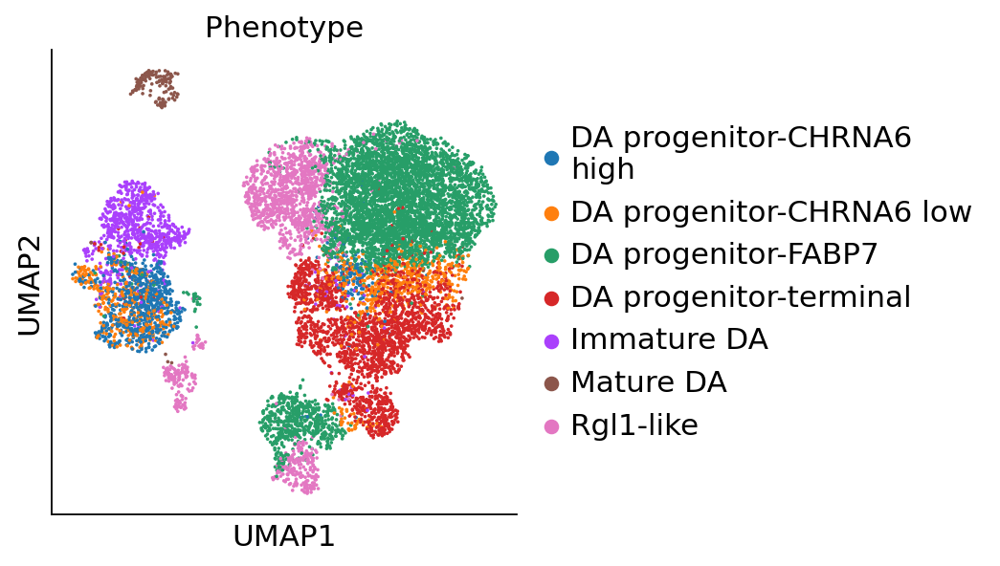

findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: 

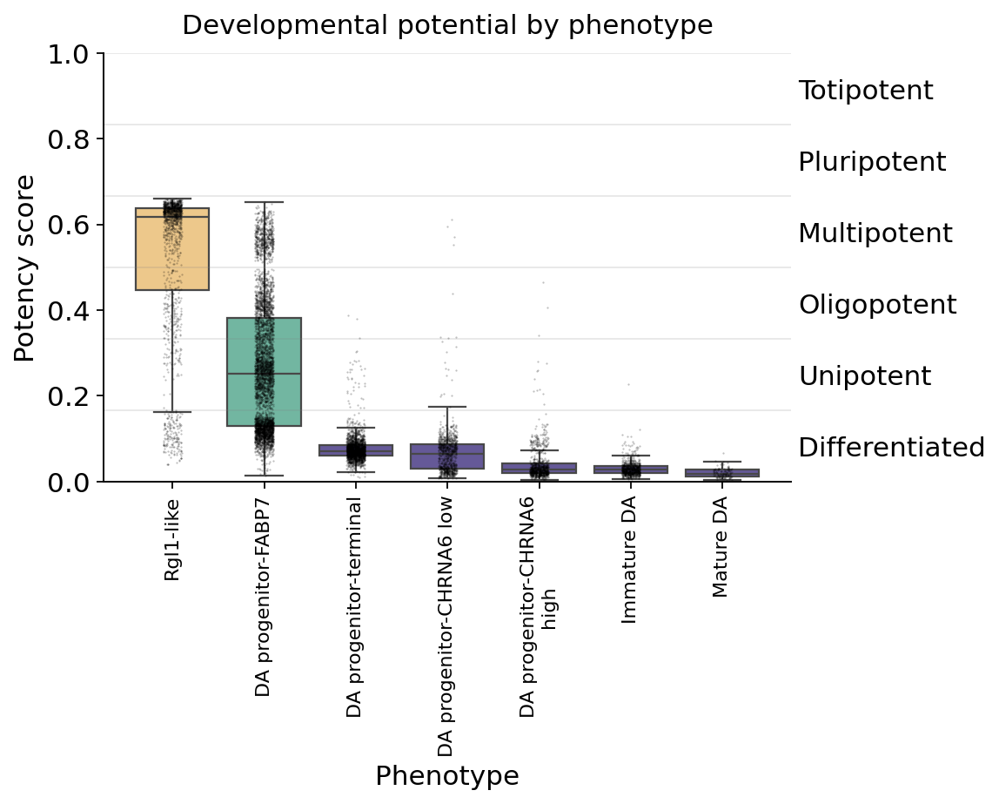

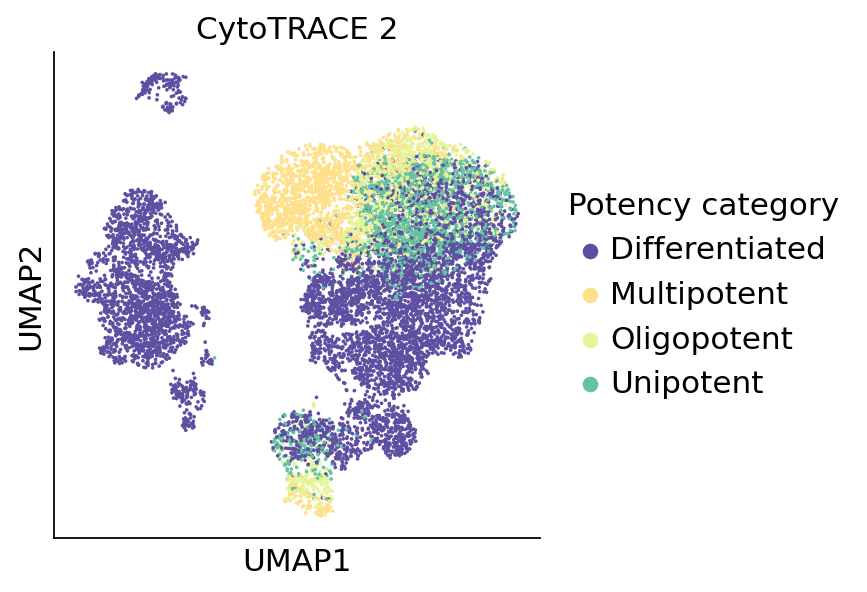

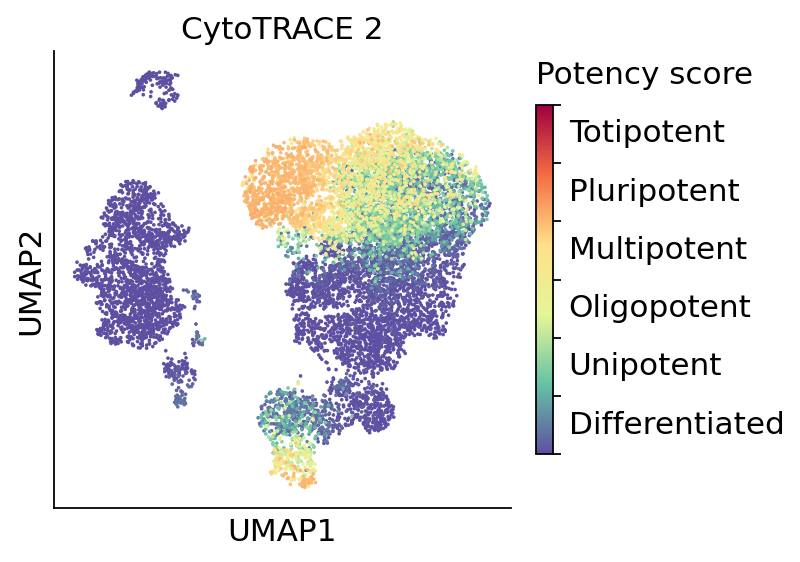

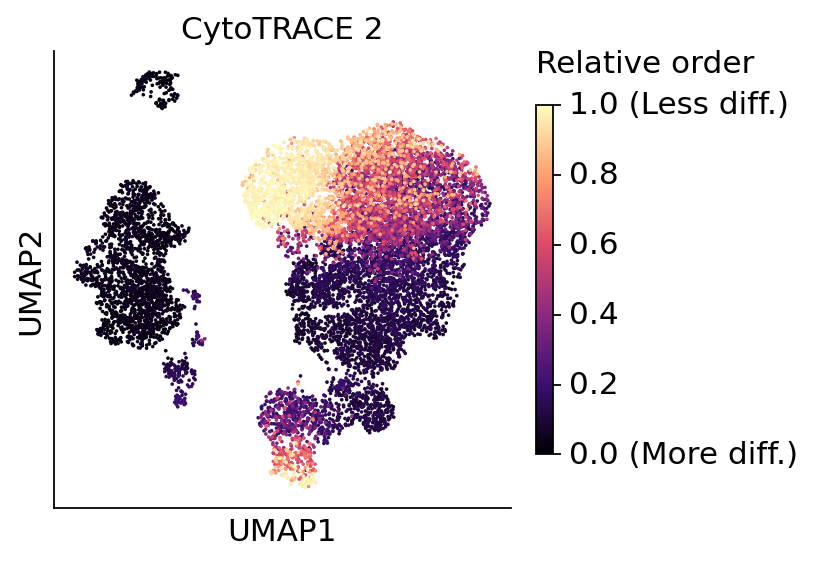

In [33]:
from cytotrace2_py.cytotrace2_py import *

input_path = "expression_matrix_counts.txt"
example_annotation_path = "cell_metadata.txt"
example_species = "human"
#precomputed_umap = pd.read_csv('umap_coordinates.csv', index_col=0)

results =  cytotrace2(input_path,
                     annotation_path=example_annotation_path,
                     species=example_species,
                     #existing_umap=precomputed_umap
                     #disable_parallelization=True,
                     #disable_plotting=True
                     )

In [7]:
results

,CytoTRACE2_Score,CytoTRACE2_Potency,CytoTRACE2_Relative,preKNN_CytoTRACE2_Score,preKNN_CytoTRACE2_Potency
rat12M_A_CTCCTCCAGCTGCCTG-1,0.021576,Differentiated,0.027215,0.016722,Differentiated
rat12M_A_CAGGCCACATTGTTGG-1,0.014729,Differentiated,0.016776,0.016929,Differentiated
rat12M_A_CTGTCGTGTGAGCGAT-1,0.031919,Differentiated,0.042984,0.029151,Differentiated
rat12M_A_GTTACCCGTTGATGTC-1,0.024636,Differentiated,0.031880,0.010962,Differentiated
rat12M_A_CGGGACTGTCAGGAGT-1,0.035931,Differentiated,0.049101,0.025930,Differentiated
...,...,...,...,...,...
P1B_CAGCGTGCACTGCATA-1,0.091537,Differentiated,0.133881,0.117036,Differentiated
P1B_GAAATGAGTTGTCATG-1,0.647889,Multipotent,0.982126,0.659166,Multipotent
P1B_ATCAGGTCATTGCAGT-1,0.123250,Differentiated,0.182233,0.115281,Differentiated
P1B_CTCATTAAGCATTTAC-1,0.104179,Differentiated,0.153156,0.114724,Differentiated


In [8]:
# 确保索引与 adata_sub 完全一致
results = results.reindex(adata_sub.obs_names)

# 将各列添加到 adata_sub 的 obs 中
adata_sub.obs = pd.concat([adata_sub.obs, results], axis=1)

In [53]:
adata_sub.obs

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,RNA_snn_res.0.1,RNA_snn_res.0.2,RNA_snn_res.0.3,RNA_snn_res.0.4,RNA_snn_res.0.5,RNA_snn_res.0.6,...,RNA_snn_res.3,human_celltypes_250325,human_celltypes_250327,human_celltypes_250330,human_celltypes_250416,CytoTRACE2_Score,CytoTRACE2_Potency,CytoTRACE2_Relative,preKNN_CytoTRACE2_Score,preKNN_CytoTRACE2_Potency
rat12M_A_CTCCTCCAGCTGCCTG-1,rat12M_A,10659.0,4900.0,0.189873,1,3,13,5,21,20,...,30,DAN-1,DAN-1,DAN-1,Immature DA,0.018184,Differentiated,0.018822,0.016149,Differentiated
rat12M_A_CAGGCCACATTGTTGG-1,rat12M_A,22573.0,6803.0,0.495028,1,3,13,5,11,12,...,28,DAP-3,DAP-3-wanted,DAP-3-wanted,DA progenitor-CHRNA6 high,0.027704,Differentiated,0.033314,0.030969,Differentiated
rat12M_A_CTGTCGTGTGAGCGAT-1,rat12M_A,20958.0,6921.0,0.036770,1,3,13,5,11,12,...,28,DAP-3,DAP-3-wanted,DAP-3-wanted,DA progenitor-CHRNA6 high,0.028329,Differentiated,0.034266,0.040131,Differentiated
rat12M_A_GTTACCCGTTGATGTC-1,rat12M_A,20339.0,6916.0,0.177396,1,3,13,5,21,20,...,63,DAN-1,DAP-3-wanted,DAP-3-wanted,DA progenitor-CHRNA6 high,0.048453,Differentiated,0.064899,0.038484,Differentiated
rat12M_A_CGGGACTGTCAGGAGT-1,rat12M_A,20612.0,6628.0,0.056649,1,3,13,5,21,20,...,30,DAN-1,DAN-1,DAN-1,Immature DA,0.030316,Differentiated,0.037291,0.032679,Differentiated
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
P1B_CAGCGTGCACTGCATA-1,SeuratProject,6576.0,3003.0,3.443158,1,3,12,13,13,11,...,4,DAP-4,DAP-4,DAP-4,DA progenitor-terminal,0.113729,Differentiated,0.164262,0.139941,Differentiated
P1B_GAAATGAGTTGTCATG-1,SeuratProject,11968.0,4997.0,3.083306,1,0,10,11,14,15,...,14,DAP-1,DAP-1,DAP-1,Rgl1-like,0.639259,Multipotent,0.964230,0.627536,Multipotent
P1B_ATCAGGTCATTGCAGT-1,SeuratProject,7269.0,3317.0,3.226238,1,0,0,0,0,0,...,3,DAP-2,DAP-2,DAP-2,DA progenitor-FABP7,0.127531,Differentiated,0.185273,0.130125,Differentiated
P1B_CTCATTAAGCATTTAC-1,SeuratProject,3150.0,1852.0,7.960644,1,0,0,0,0,0,...,3,DAP-2,DAP-2,DAP-2,DA progenitor-FABP7,0.120503,Differentiated,0.174573,0.141989,Differentiated


computing neighbors
    finished (0:00:02)
computing UMAP
    finished (0:00:07)


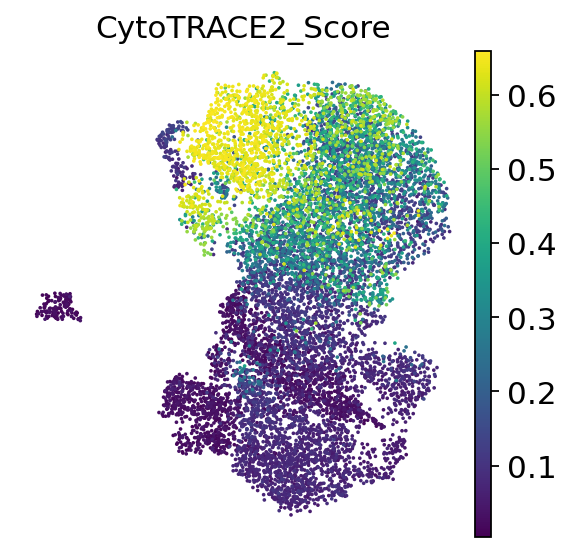

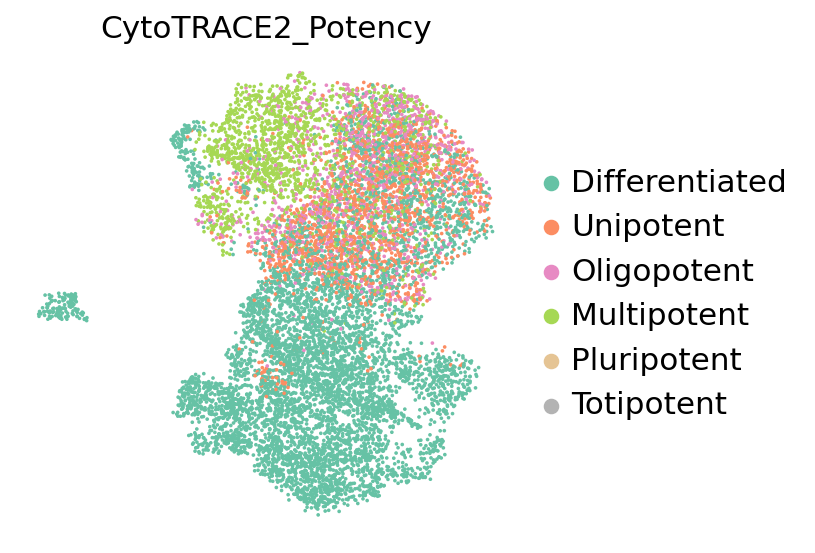

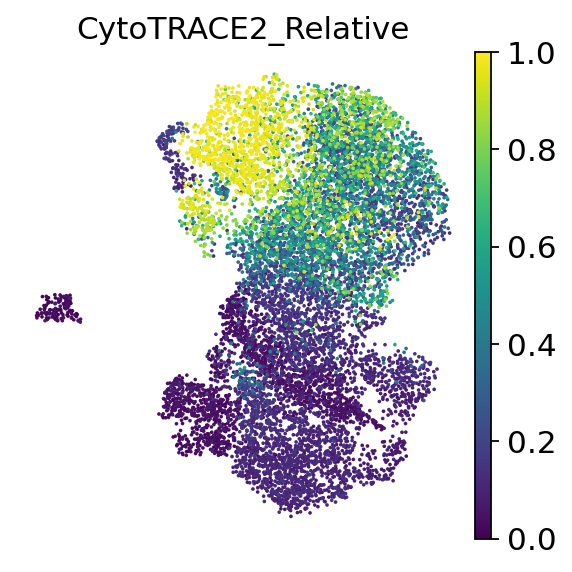

In [31]:
n_neighbors=10
n_pcs=23
min_dist=0.5
spread=0.5

sc.pp.neighbors(
    adata_sub, 
    n_neighbors=n_neighbors, 
    n_pcs=n_pcs,  # 使用校正后的前30个PC
    use_rep='X_integrated.rpca', # 明确指定使用校正后的PCA
    random_state=18
)
sc.tl.umap(adata_sub, min_dist=min_dist,spread=spread)
sc.pl.umap(
       adata_sub,
       color='CytoTRACE2_Score',
       palette='Set2',
       show=True,
       frameon=False,
      # title=f'n_neighbors={n_neighbors},n_pcs={n_pcs}, min_dist={min_dist}, spread={spread}',
       save=f'UMAP_cytotrace2_Score_n_neighbors{n_neighbors}_npcs{n_pcs}_mindist{min_dist}_spread{spread}.png'
   )
sc.pl.umap(
       adata_sub,
       color='CytoTRACE2_Potency',
       palette='Set2',
       show=True,
       frameon=False,
      # title=f'n_neighbors={n_neighbors},n_pcs={n_pcs}, min_dist={min_dist}, spread={spread}',
       save=f'UMAP_cytotrace2_Potency_n_neighbors{n_neighbors}_npcs{n_pcs}_mindist{min_dist}_spread{spread}.png'
   )
sc.pl.umap(
       adata_sub,
       color='CytoTRACE2_Relative',
       palette='Set2',
       show=True,
       frameon=False,
      # title=f'n_neighbors={n_neighbors},n_pcs={n_pcs}, min_dist={min_dist}, spread={spread}',
       save=f'UMAP_cytotrace2_Relative_n_neighbors{n_neighbors}_npcs{n_pcs}_mindist{min_dist}_spread{spread}.png'
   )

In [88]:
adata_sub.obsm['X_umap']

array([[-4.079477  , -7.8259897 ],
       [-2.453529  , -5.7716494 ],
       [-2.5077174 , -7.986234  ],
       ...,
       [ 0.5262897 , -0.8939421 ],
       [ 2.2435355 , -1.4280877 ],
       [ 1.6102304 , -0.09037569]], dtype=float32)

Text(0, 0.5, 'Potency Score')

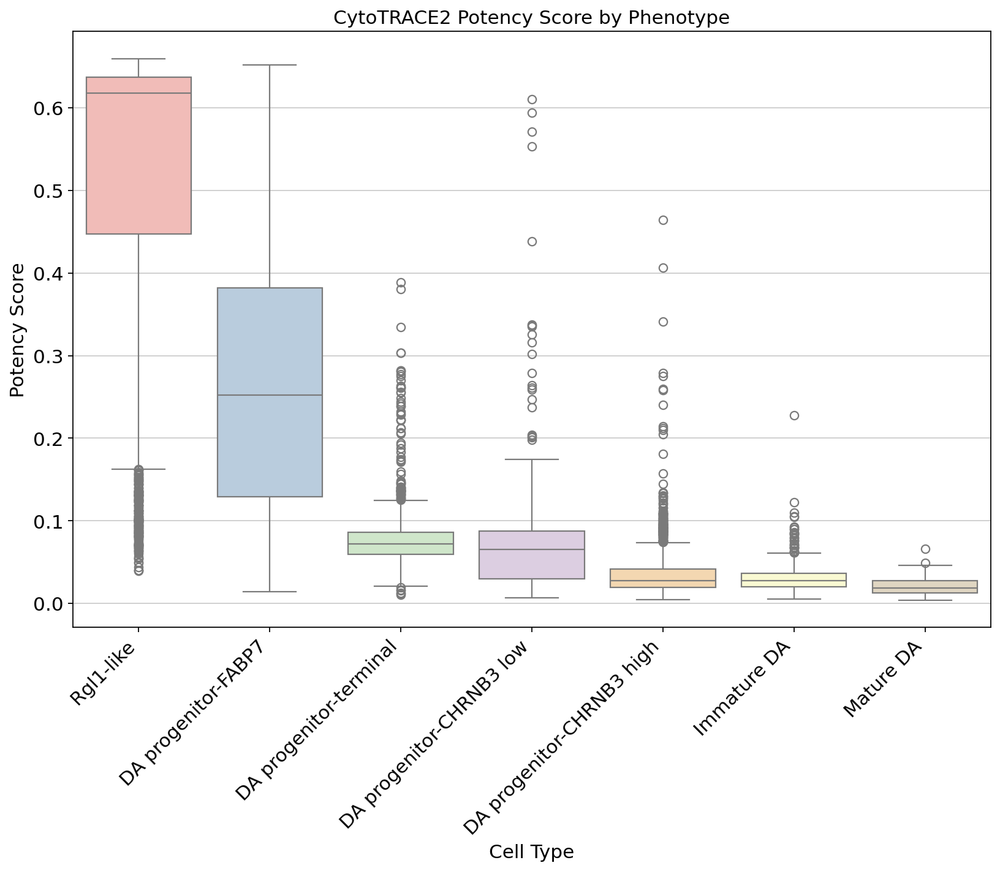

In [15]:
plt.figure(figsize=(12, 8))
umap_coords = pd.DataFrame(
    adata_sub.obsm['X_umap'], 
    columns=['UMAP2', 'UMAP3'], 
    index=adata_sub.obs_names
)
df = adata_sub.obs.join(umap_coords)
# 方法一：按中位数排序（推荐，对异常值稳健）
sorted_categories = df.groupby("human_celltypes_250418")["CytoTRACE2_Score"] \
                     .median() \
                     .sort_values(ascending=False) \
                     .index.tolist()

import matplotlib.pyplot as plt
import seaborn as sns
sns.boxplot(
    data=df,
    x="human_celltypes_250418",
    y="CytoTRACE2_Score",
    palette="Pastel1",
    order=sorted_categories
)
plt.title("CytoTRACE2 Potency Score by Phenotype")
plt.xticks(rotation=45, ha='right')
plt.xlabel("Cell Type")
plt.ylabel("Potency Score")
#plt.savefig("cytotrace2_potency_score_by_phenotype.png")
#plt.close()

In [3]:
adata=sc.read_h5ad("/storage2/liuxiaodongLab/jiangjing/Projects/YutingFu/PD_YutingFu/umap_monocle3_cytoTRACE2/scanpy_UMAP_n_neighbors10_npcs23_mindist0.5_spread0.5.h5ad")

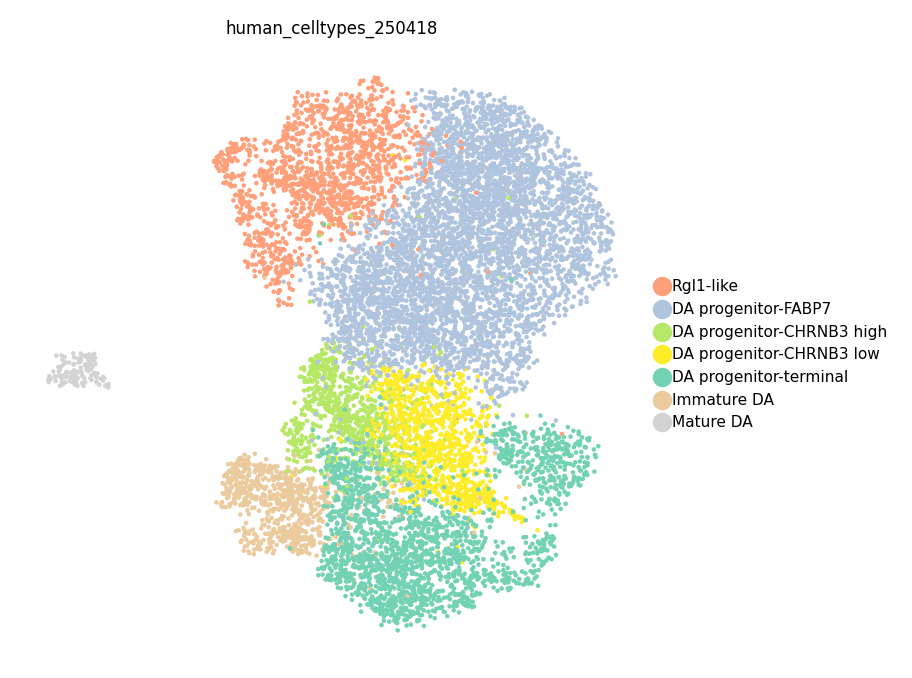

In [19]:
# 定义自定义颜色调色板
custom_palette = ['#FFA07A', '#B0C4DE', '#B6E765', '#FFEC29', '#74D2B4', '#EBCB9D', '#D3D3D3']

# 使用自定义颜色调色板绘制UMAP图
sc.pl.umap(
    adata,
    color='human_celltypes_250418',
    palette=custom_palette,
    show=True,
    frameon=False,
    sort_order=True
)

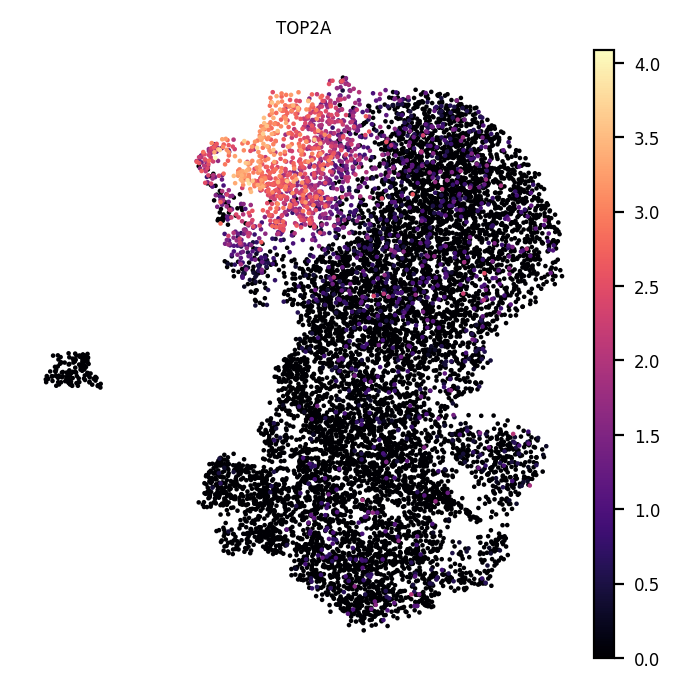

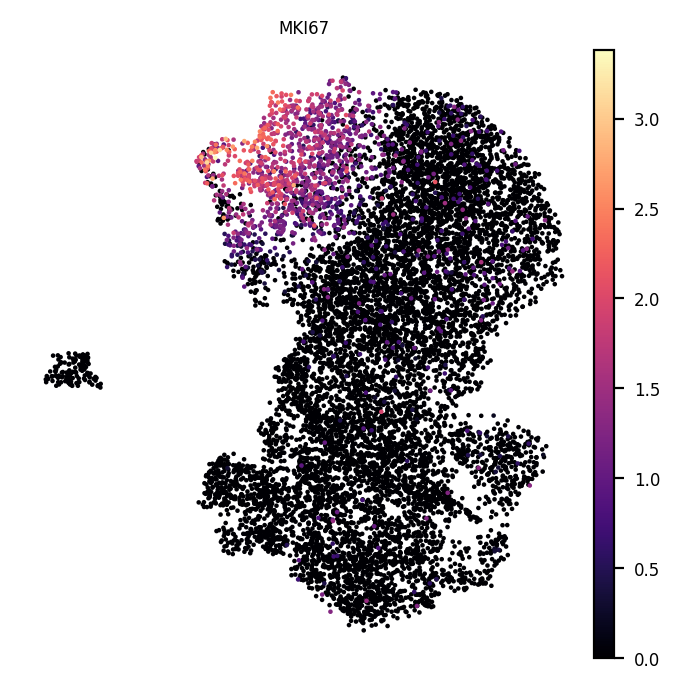

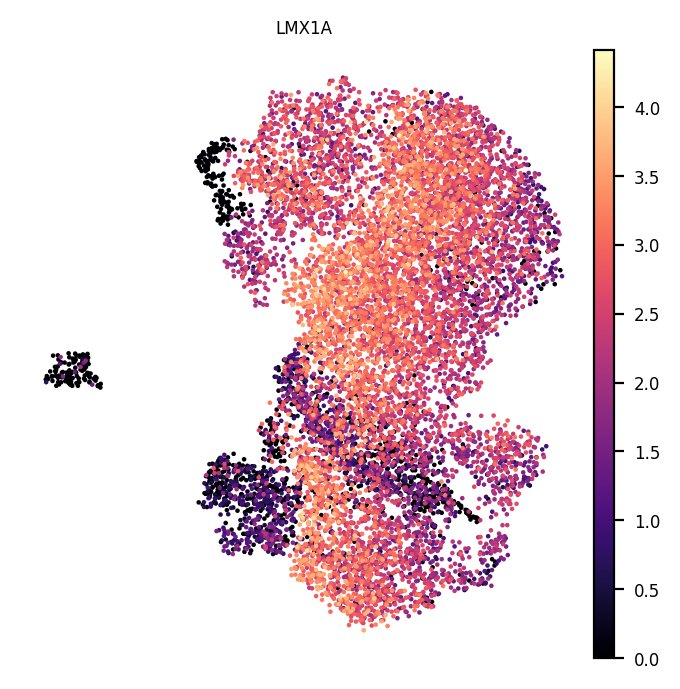

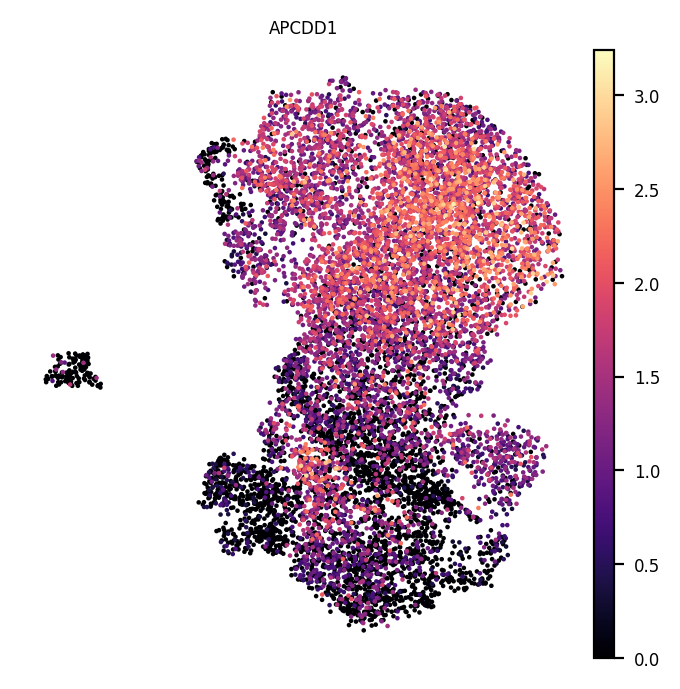

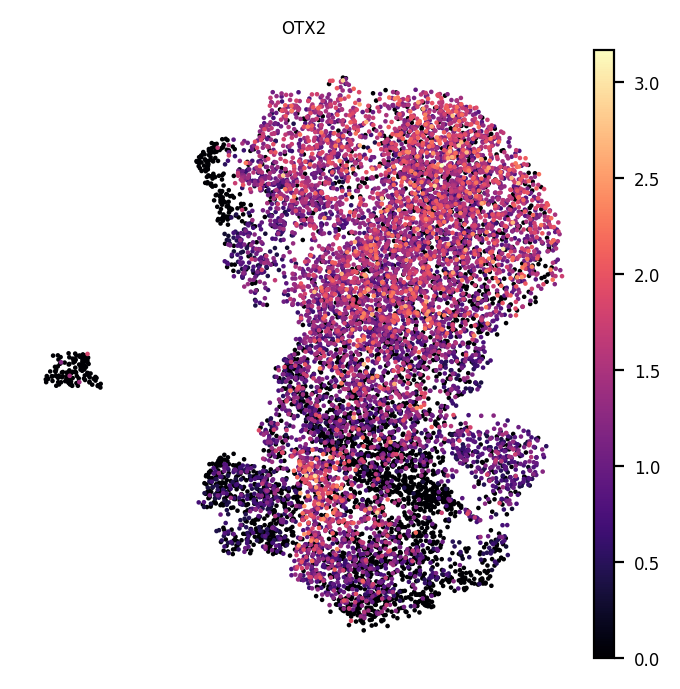

...

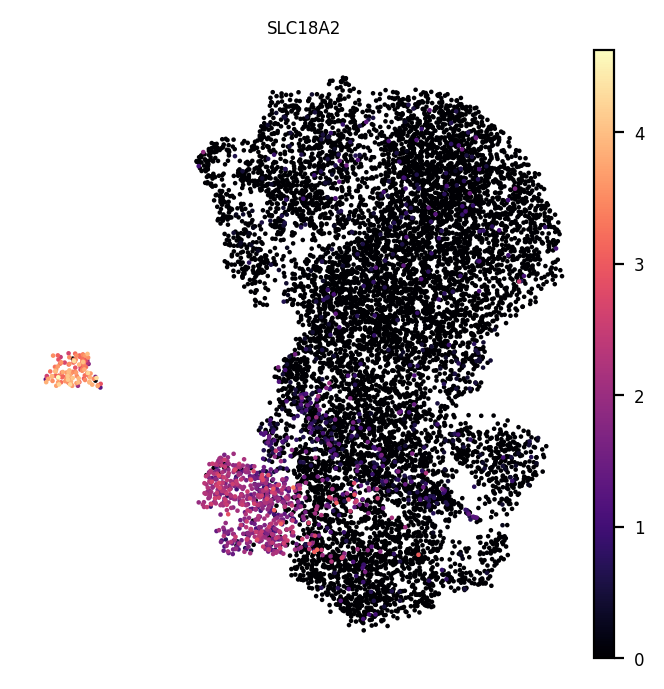

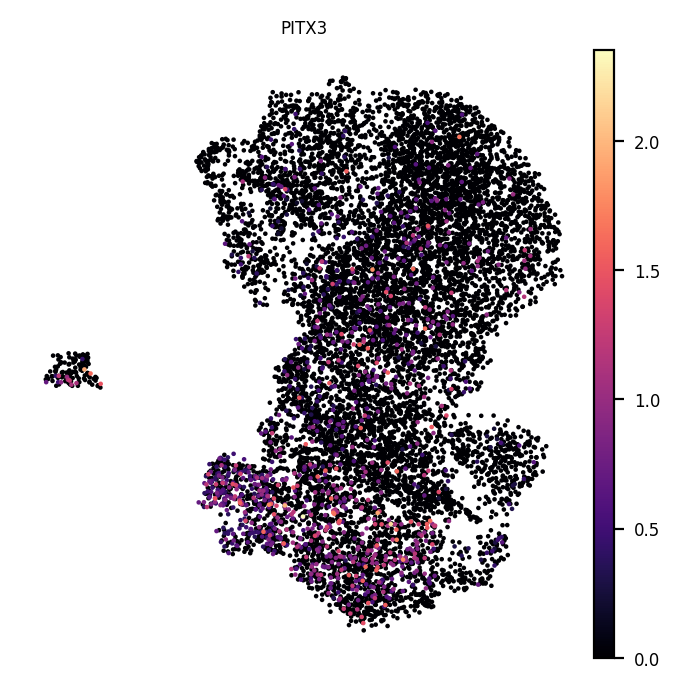

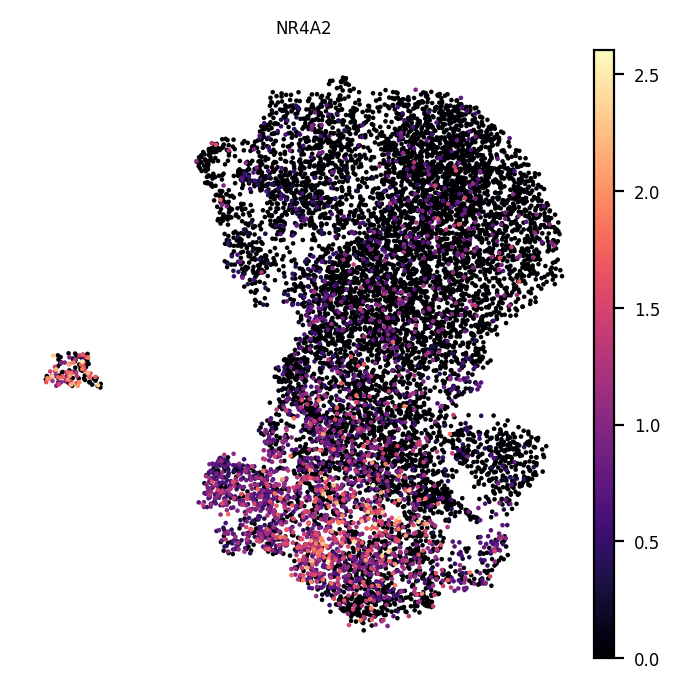

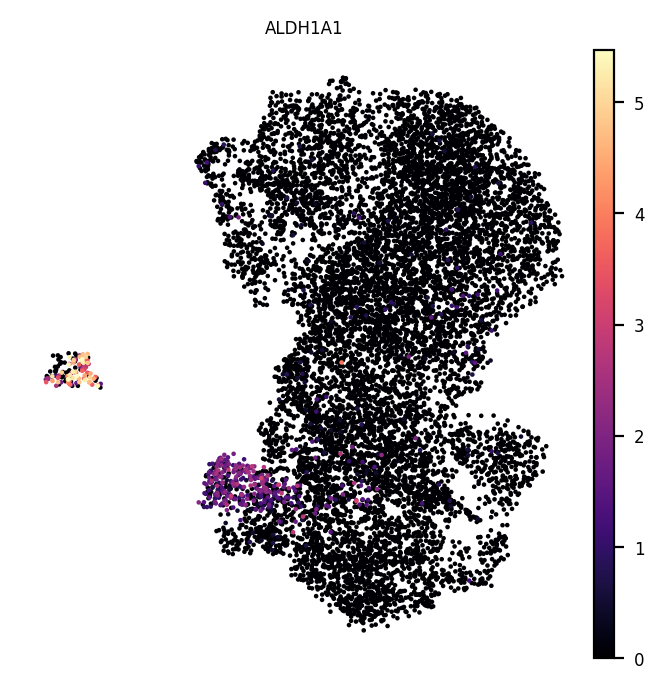

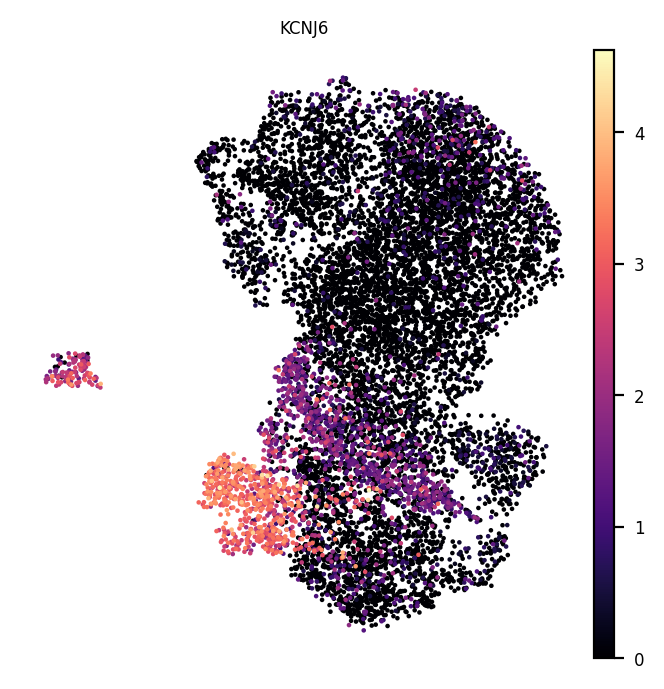

In [22]:
gene_lists=["top2a","mki67","Lmx1a","Apcdd1","OTX2","TTR","FABP7","CHRNA6","CHRNB3","DDC","ASCL1","EN1",
            "KCNJ6","TH","SLC6A3","SLC18A2","PITX3","NR4A2","ALDH1A1","KCNJ6"]
gene_lists = [gene.upper() for gene in gene_lists]  # 全大写
for gene in gene_lists:
    sc.pl.umap(adata, color=gene, show=True, frameon=False,cmap='magma',save=f'umap_gene_{gene}_expression.png')